In [1]:
# Importing of libraries
import pandas as pd
import numpy as np
from __future__ import print_function
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [8]:
df = pd.read_excel('cropsoil2.xlsx')

In [9]:
df.head()

,id,soil_id,fertlizer_id,loc_id,time_id,crop_id,pattern_id,fertilizer_type,stype_id,vill_id,...,csoil_P,csoil_K,ratio_amt_N,ratio_amt_p2o5,ratio_amt_k2o,cult_area,area_irri,production,producitivity,area_sown
0,1,3401,91101,101,9851,91101,7101,"urea, super phosphate",8101,226451,...,6.10,270,4.0,2,2,2134,2103,4676,1856,0.750
1,2,3402,91102,102,9852,91102,7102,"ammonium nitrate or urea,superphosphate",8102,226452,...,4.90,348,4.0,6,4,112,98,1245,1432,0.220
2,3,3403,91103,103,9853,91103,7103,"urea, super phosphate",8103,226453,...,6.45,280,4.0,2,2,2155,2151,4987,1947,0.850
3,4,3404,91104,104,9854,91104,7104,"ammonium nitrate or urea,superphosphate",8104,226454,...,5.10,236,4.0,2,2,1346,945,993,1780,0.830
4,5,3405,91105,105,9855,91105,7105,"ammonium nitrate or urea,superphosphate",8105,226455,...,4.90,324,4.0,2,1,238,235,981,978,0.457


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390 entries, 0 to 389
Data columns (total 49 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               390 non-null    int64  
 1   soil_id          390 non-null    int64  
 2   fertlizer_id     390 non-null    int64  
 3   loc_id           390 non-null    int64  
 4   time_id          390 non-null    int64  
 5   crop_id          390 non-null    int64  
 6   pattern_id       390 non-null    int64  
 7   fertilizer_type  390 non-null    object 
 8   stype_id         390 non-null    int64  
 9   vill_id          390 non-null    int64  
 10  vill-name        390 non-null    object 
 11  dist_code        390 non-null    object 
 12  block            390 non-null    object 
 13  cal_year         390 non-null    int64  
 14  soil_type        390 non-null    object 
 15  soil_texture     390 non-null    object 
 16  land_classify    390 non-null    object 
 17  jan             

In [11]:
df.isna().sum()

id                 0
soil_id            0
fertlizer_id       0
loc_id             0
time_id            0
crop_id            0
pattern_id         0
fertilizer_type    0
stype_id           0
vill_id            0
vill-name          0
dist_code          0
block              0
cal_year           0
soil_type          0
soil_texture       0
land_classify      0
jan                0
feb                0
mar                0
apr                0
may                0
jun                0
jul                0
aug                0
sep                0
oct                0
nov                0
dec                0
crop_name          0
soil_pH            0
soil_EC            0
Soil_N             0
soil_P             0
soil_K             0
fsoil_N            0
fsoil_P            0
fsoil_K            0
csoil_N            0
csoil_P            0
csoil_K            0
ratio_amt_N        0
ratio_amt_p2o5     0
ratio_amt_k2o      0
cult_area          0
area_irri          0
production         0
producitivity

In [13]:
df.columns

Index(['id', 'soil_id', 'fertlizer_id', 'loc_id', 'time_id', 'crop_id',
       'pattern_id', 'fertilizer_type', 'stype_id', 'vill_id', 'vill-name',
       'dist_code', 'block', 'cal_year', 'soil_type', 'soil_texture',
       'land_classify', 'jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug',
       'sep', 'oct', 'nov', 'dec', 'crop_name', 'soil_pH', 'soil_EC', 'Soil_N',
       'soil_P', 'soil_K', 'fsoil_N', 'fsoil_P', 'fsoil_K', 'csoil_N',
       'csoil_P', 'csoil_K', 'ratio_amt_N', 'ratio_amt_p2o5', 'ratio_amt_k2o',
       'cult_area', 'area_irri', 'production', 'producitivity', 'area_sown'],
      dtype='object')

In [12]:
for name, dtype in df.dtypes.items():
    print(name, "|",dtype)

id | int64
soil_id | int64
fertlizer_id | int64
loc_id | int64
time_id | int64
crop_id | int64
pattern_id | int64
fertilizer_type | object
stype_id | int64
vill_id | int64
vill-name | object
dist_code | object
block | object
cal_year | int64
soil_type | object
soil_texture | object
land_classify | object
jan | object
feb | object
mar | object
apr | object
may | object
jun | object
jul | object
aug | object
sep | object
oct | object
nov | object
dec | object
crop_name | object
soil_pH | float64
soil_EC | float64
Soil_N | int64
soil_P | float64
soil_K | int64
fsoil_N | int64
fsoil_P | float64
fsoil_K | int64
csoil_N | int64
csoil_P | float64
csoil_K | int64
ratio_amt_N | float64
ratio_amt_p2o5 | int64
ratio_amt_k2o | int64
cult_area | int64
area_irri | int64
production | int64
producitivity | int64
area_sown | float64


## Remove Categorical Data

In [14]:
def getting_cat_cols(df):
    cat = []
    for name, dtype in df.dtypes.items():
        if dtype == 'object':
            cat.append(name)
    return cat

In [16]:
cat_cols = getting_cat_cols(df)

In [17]:
cat_cols

['fertilizer_type',
 'vill-name',
 'dist_code',
 'block',
 'soil_type',
 'soil_texture',
 'land_classify',
 'jan',
 'feb',
 'mar',
 'apr',
 'may',
 'jun',
 'jul',
 'aug',
 'sep',
 'oct',
 'nov',
 'dec',
 'crop_name']

In [18]:
lr = LabelEncoder()
def label_encoding(df, cat_cols):
    for i in cat_cols:
        df[i] = lr.fit_transform(df[i])
    return df

In [19]:
df = label_encoding(df, cat_cols)

In [20]:
df.head()

,id,soil_id,fertlizer_id,loc_id,time_id,crop_id,pattern_id,fertilizer_type,stype_id,vill_id,...,csoil_P,csoil_K,ratio_amt_N,ratio_amt_p2o5,ratio_amt_k2o,cult_area,area_irri,production,producitivity,area_sown
0,1,3401,91101,101,9851,91101,7101,1,8101,226451,...,6.10,270,4.0,2,2,2134,2103,4676,1856,0.750
1,2,3402,91102,102,9852,91102,7102,0,8102,226452,...,4.90,348,4.0,6,4,112,98,1245,1432,0.220
2,3,3403,91103,103,9853,91103,7103,1,8103,226453,...,6.45,280,4.0,2,2,2155,2151,4987,1947,0.850
3,4,3404,91104,104,9854,91104,7104,0,8104,226454,...,5.10,236,4.0,2,2,1346,945,993,1780,0.830
4,5,3405,91105,105,9855,91105,7105,0,8105,226455,...,4.90,324,4.0,2,1,238,235,981,978,0.457


## Pairplot

In [21]:
sns.pairplot(df, kind = 'scatter' , plot_kws = {'alpha' : 0.3})

## Headmap

<Axes: >

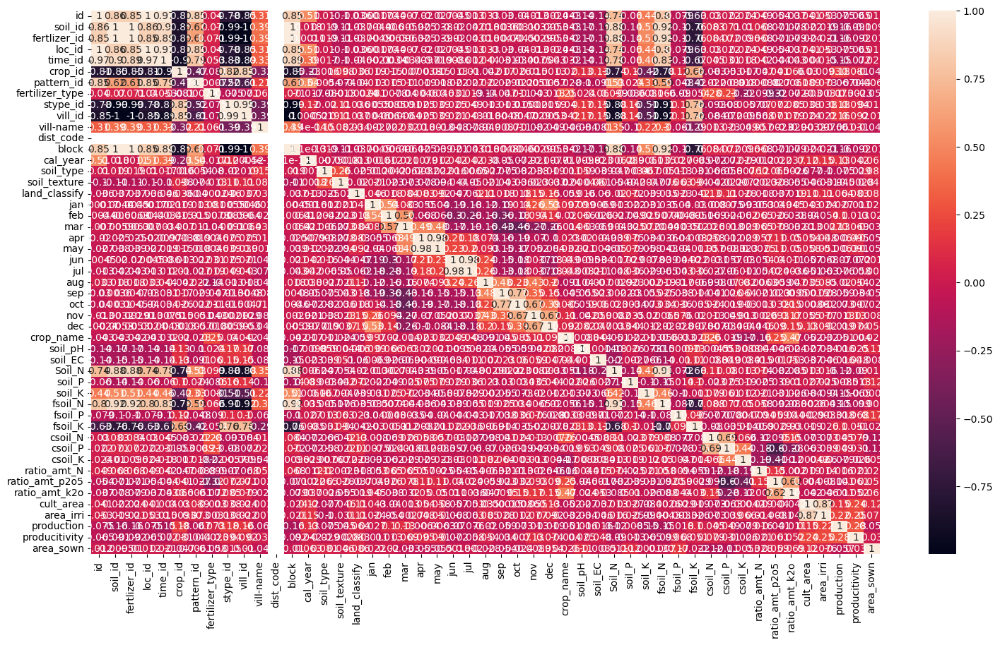

In [ ]:
plt.figure(figsize=(18, 10))
sns.heatmap(df.corr(), annot = True)